# Проектная работа: рынок заведений общественного питания г. Москвы.

**Описание проекта**: Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены

**Цель исследования**: подготовить исследование рынка общественного питания г. Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

1. [Загрузка данных](#initializing)
2. [Предобработка данных.](#preprocessing)
    * [Предобработка дубликатов.](#duplicates)
    * [Добавление необходимых столбцов.](#addendum)
    * [Предобработка пропусков в данных.](#null)
3. [Анализ данных](#analysis)
    * [Анализ категорий заведений.](#category)
    * [Анализ количества посадочных мест по категориям.](#seats)
    * [Анализ соотношения сетевых и несетевых заведений.](#ratio)
    * [Категории заведений, которые чаще являются сетевыми.](#ratio_cat)
    * [Анализ топ-15 популярных сетей в Москве.](#top_15)
    * [Анализ категорий заведений по округам г. Москвы.](#district)
    * [Анализ средних рейтингов по категориям заведений.](#rating_mean)
    * [Построение фоновой картограммы (хороплет) со средним рейтингом заведений каждого района.](#choropleth)
    * [Отображение всех заведений датасета на карте с помощью кластеров.](#clusters)
    * [Анализ топ-15 улиц по количеству заведений.](#top_15_count)
    * [Анализ улиц с одним объектом общепита.](#single_object)
    * [Анализ средних чеков заведений.](#mean_bill)
    * [Промежуточный вывод.](#prelim)
4. [Детализирование исследования: открытие кофейни.](#detailed)
5. [Вывод.](#conclusion)

## Загрузка данных. <a id="initializing"></a> 

In [1]:
# Импортируем библиотеки
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import warnings
warnings.simplefilter('ignore')

In [2]:
# Загружаем датасет
pd.set_option('display.max_columns', None)
path = '/datasets/'
df = pd.read_csv(path + 'moscow_places.csv', sep=',')
# Выведем первые и последние 5 строк датафрейма
display(df.head(5))
display(df.tail(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


In [3]:
# Выведем общую информацию по датафрейму
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Исходя из общей информации в датафрейме имеются 8406 записей. Стоит отметь значительное число пропусков в столбцах, содержащих значения ценовой категории заведения, среднего чека, часов работы и количества посадочных мест. Типы переменных соответствуют описанию данных предоставленного датафрейма.

## Предобработка данных. <a id="preprocessing"></a> 

### Предобработка дубликатов. <a id="duplicates"></a> 

In [4]:
# Посчитаем количество явных дубликатов
print('количество явных дубликатов:', df.duplicated().sum())

количество явных дубликатов: 0


Явные дубликаты в таблице отсутствуют. Попытаемся найти неявные дубликаты. Вероятнее всего они присутствуют в столбцах с наименованием заведения, адресом и координатами.

In [5]:
# Приведем имена и адреса к нижнему регистру
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()
# Проверим наличие неявных дубликатов 
cols = ['name', 'address', 'lat', 'lng']
df[df.duplicated(subset=cols)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [6]:
# Удалим дубликат
df.drop_duplicates(subset=cols, inplace=True)

### Добавление необходимых столбцов. <a id="addendum"></a> 

In [7]:
# Создадим столбец street с названиями улиц
df['street'] = df['address'].str.split(', ').str[1]

In [8]:
# Создадим столбец с обозначением, что заведение работает ежедневно и круглосуточно 24/7
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')
# Посмотрим на результат
df.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2175,кофебар спесь,кофейня,"москва, шереметьевская улица, 2, стр. 1",Северо-Восточный административный округ,"пн-пт 08:00–00:00; сб,вс 08:00–18:00",55.793686,37.618880,4.7,средние,Цена чашки капучино:150–180 ₽,NaN,165.0,0,120.0,шереметьевская улица,False
4425,soul in the bowl,кафе,"москва, улица земляной вал, 9",Центральный административный округ,пн-пт 08:00–20:00,55.761690,37.658536,4.1,NaN,NaN,NaN,NaN,1,132.0,улица земляной вал,False
5052,самса № 1,быстрое питание,"москва, павелецкая площадь, 1",Центральный административный округ,"ежедневно, круглосуточно",55.731378,37.641031,4.3,средние,Средний счёт:380–500 ₽,440.0,NaN,1,150.0,павелецкая площадь,True
7409,зебо,кафе,"москва, чагинская улица, вл3а",Юго-Восточный административный округ,NaN,55.660903,37.810400,4.0,NaN,NaN,NaN,NaN,0,NaN,чагинская улица,NaN
3417,кафе чайковский,ресторан,"москва, триумфальная площадь, 4",Центральный административный округ,"ежедневно, 11:00–00:00",55.769019,37.596138,4.7,NaN,NaN,NaN,NaN,0,NaN,триумфальная площадь,False


### Предобработка пропусков в данных.<a id="null"></a> 

In [9]:
# Посчитаем наличие пропусков данных
print('количество пропусков в данных:\n', df.isna().sum())

количество пропусков в данных:
 name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5090
avg_bill             4589
middle_avg_bill      5256
middle_coffee_cup    7870
chain                   0
seats                3611
street                  0
is_24_7               536
dtype: int64


В нашем датафрейме имеется большое количество пропусков. Что-либо сделать с ними не прдеставляется возможным, т.к. они занимают слишком большую долю от общего числа строк. При их удалении или заменой медианными значениями возникнут серьезные искажения. 

In [10]:
# Выведем 10 случайных строк датафрейма
df.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3222,ресторан spettacolo,ресторан,"москва, кутузовский проспект, 48",Западный административный округ,пн-ср 11:00–00:00; чт-вс 11:00–02:00,55.731358,37.486051,4.4,высокие,Средний счёт:2500–3500 ₽,3000.0,NaN,0,98.0,кутузовский проспект,False
3452,4tuna cafe&grill,"бар,паб","москва, новинский бульвар, 31",Центральный административный округ,"ежедневно, 10:00–23:00",55.757836,37.582475,4.4,NaN,NaN,NaN,NaN,0,120.0,новинский бульвар,False
2784,снеди феди,столовая,"москва, электрозаводская улица, 27с8",Восточный административный округ,пн-пт 08:30–17:30,55.791593,37.705709,4.7,NaN,Средний счёт:300–500 ₽,400.0,NaN,1,NaN,электрозаводская улица,False
4251,hudson deli,кафе,"москва, 1-й красногвардейский проезд, 21с2",Центральный административный округ,пн-пт 08:00–20:00,55.749495,37.533647,4.2,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,NaN,1-й красногвардейский проезд,False
4024,слепой пью,"бар,паб","москва, улица арбат, 30/3с1",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.749200,37.590120,4.5,NaN,Цена бокала пива:250–490 ₽,NaN,NaN,0,NaN,улица арбат,False
2118,хинкали-gали,кафе,"москва, звёздный бульвар, 19, стр. 1",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.811762,37.625614,4.6,NaN,NaN,NaN,NaN,0,32.0,звёздный бульвар,False
5387,твоё кафе,пиццерия,"москва, энергетическая улица, 14, корп. 1",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.759063,37.708776,4.5,NaN,NaN,NaN,NaN,0,28.0,энергетическая улица,False
2406,кафетеррия,кафе,"москва, центральный административный округ, кр...",Центральный административный округ,пн-сб 07:00–19:00,55.777488,37.649468,4.1,NaN,NaN,NaN,NaN,1,NaN,центральный административный округ,False
2055,city lunch,столовая,"москва, 5-я улица ямского поля, 5с1",Северный административный округ,пн-пт 09:00–17:00; сб 12:00–14:00,55.785345,37.584976,4.0,NaN,NaN,NaN,NaN,0,NaN,5-я улица ямского поля,False
2393,вьетплюс,ресторан,"москва, каланчёвская улица, 20с1",Центральный административный округ,"пн-пт 10:00–22:00; сб,вс 12:00–22:00",55.778006,37.648268,4.1,NaN,NaN,NaN,NaN,0,NaN,каланчёвская улица,False


Предобработка данных завершена. 
- Осуществлен поиск явных дубликатов, найден один неявный дубликат, строчка с ним удалена.
- Добавлены столбцы с названием улицы и с обозначением, работает ли заведение ежедневно и/или клуглосуточно (булевый тип данных).

## Анализ данных. <a id="analysis"></a> 

### Анализ категорий заведений. <a id="category"></a> 

In [11]:
# Рассмотрим категории представленных заведений.
data = df['category'].value_counts()
data

кафе               2378
ресторан           2042
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Всего в таблице представлено 8 категорий заведений. Сам многочисленная категория - кафе, ресторан и кофейня. Самая немногочисленная категория - булочная. Визуализируем полученные данные с помощью столбчатой диаграммы.

In [12]:
# Столбчатая диаграмма
sns.set(rc={'figure.figsize':(15, 9)})
fig = px.bar(data, color_discrete_sequence=px.colors.qualitative.Antique)
fig.update_layout(showlegend=False,
                  title='Категории заведений',
                  xaxis_title='Количество заведений',
                  yaxis_title='Категория')
fig.show()

### Анализ количества посадочных мест по категориям. <a id="seats"></a> 

Напомню, что в датафрейме пропущены значения по 3611 заведениям, значит, придется при анализе посадочных мест придется опираться на неполную статистику по имеющимся данным.

In [13]:
# Исключим пропущенные 3611 значений
av_seats = df[df['seats'].notna()]

In [14]:
# Посмотрим на среднее количество мест по категориям заведений
av_seats_pivot = av_seats.pivot_table(index='category', values='seats', aggfunc='mean').sort_values(by='seats', ascending=False).reset_index()
av_seats_pivot['seats'] = av_seats_pivot['seats'].round(2)
av_seats

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица,False
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,клязьминская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


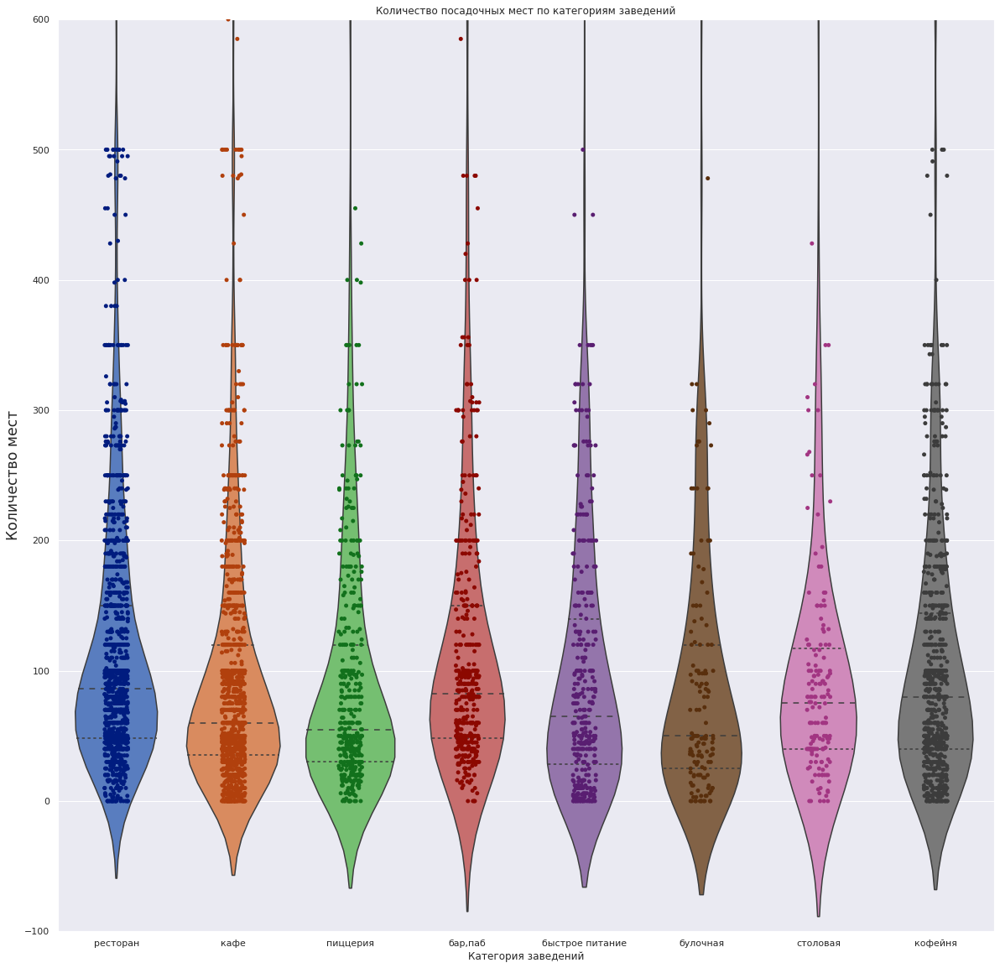

In [15]:
# Визулизируем данные
sns.set(rc={'figure.figsize':(20, 20)})
fig, ax = plt.subplots()
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='category', y='seats', data=av_seats, palette='muted', split=True, inner="quart", fill=False) 
ax = sns.stripplot(x='category', y='seats', data=av_seats, palette='dark')
# в данных присутствуют выбросы, ограничим выборку в 600 макс. посадочных мест
ax.set_ylim(-100, 600) 
plt.ylabel('Количество мест', size='x-large')
plt.xlabel('Категория заведений')
plt.title('Количество посадочных мест по категориям заведений');

Из графика и табилицы видно, что средние значения количества посадочных мест наиболее высокие у баров, ресторанов и кофеен. Наиболее низкое значение у булочных и пиццерий. Не трудно догадаться, что в завадениях, которые работают "навынос", присутствует меньшее количество посадочных мест.

### Анализ соотношения сетевых и несетевых заведений. <a id="ratio"></a> 

In [16]:
# cоздадим сводную таблицу, отражающую сетевые и несетевые заведения
network_ratio = df.pivot_table(index='chain', values='name', aggfunc='count').reset_index()
network_ratio['chain'] = network_ratio.replace(0, 'несетевые')
network_ratio['chain'] = network_ratio.replace(1, 'сетевые')
network_ratio.columns = ['chain', 'count']
network_ratio

,chain,count
0,несетевые,5201
1,сетевые,3204


In [17]:
# Создадим интерактиваную круговую диаграмму
fig = go.Figure()
fig = px.pie(network_ratio, values=network_ratio['count'], 
             names=network_ratio['chain'],
             title='Диаграмма соотношения сетевых и несетевых заведений',
             color_discrete_sequence=px.colors.qualitative.Antique,
             hole=0.2)
fig.show()

Из полученных данных и графика видно, что 61.9% заведений являются несетевыми, а 38.1% - сетевыми.

### Категории заведений, которые чаще являются сетевыми. <a id="ratio_cat"></a> 

In [18]:
# Создадим сводную табилцу по категориям сетевых заведений
category_pivot = df[df['chain'] == 1]
category_pivot = (category_pivot.pivot_table(index=['category'], values='chain', aggfunc='count')
                  .sort_values(by='chain', ascending=False)
                  .reset_index())
category_pivot.columns = ['category', 'count']
category_pivot

,category,count
0,кафе,779
1,ресторан,729
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


In [19]:
# Визуализируем данные интерактиваной круговой диаграммой
fig = go.Figure()
fig = px.pie(category_pivot, values=category_pivot['count'], 
             names=category_pivot['category'],
             title='Диаграмма соотношения категорий сетевых заведений',
             color_discrete_sequence=px.colors.qualitative.Antique,
             hole=0.2)
fig.show()

Из полученной таблицы и диаграммы видно, что самые популярные категории сетевых заведений - кафе (24,3%), рестораны (22.8%) и кофейни (22.5%). В совокупности на них приходится 2/3 сетевых заведений. Самая непопулярная категория сетевых заведений - столовая (2.75%).

In [20]:
# Построим сводную таблицу по сетевым и несетевым
additional_pivot = (df.pivot_table(index=['category', 'chain'], values=['name'], aggfunc='count')
                      .sort_values(by='name', ascending=False)
                      .reset_index())
additional_pivot['chain'] = additional_pivot['chain'].replace(0, 'несетевые')
additional_pivot['chain'] = additional_pivot['chain'].replace(1, 'сетевые')
additional_pivot.columns = ['category', 'chain', 'count']
additional_pivot

,category,chain,count
0,кафе,несетевые,1599
1,ресторан,несетевые,1313
2,кафе,сетевые,779
3,ресторан,сетевые,729
4,кофейня,сетевые,720
5,кофейня,несетевые,693
6,"бар,паб",несетевые,596
7,быстрое питание,несетевые,371
8,пиццерия,сетевые,330
9,пиццерия,несетевые,303


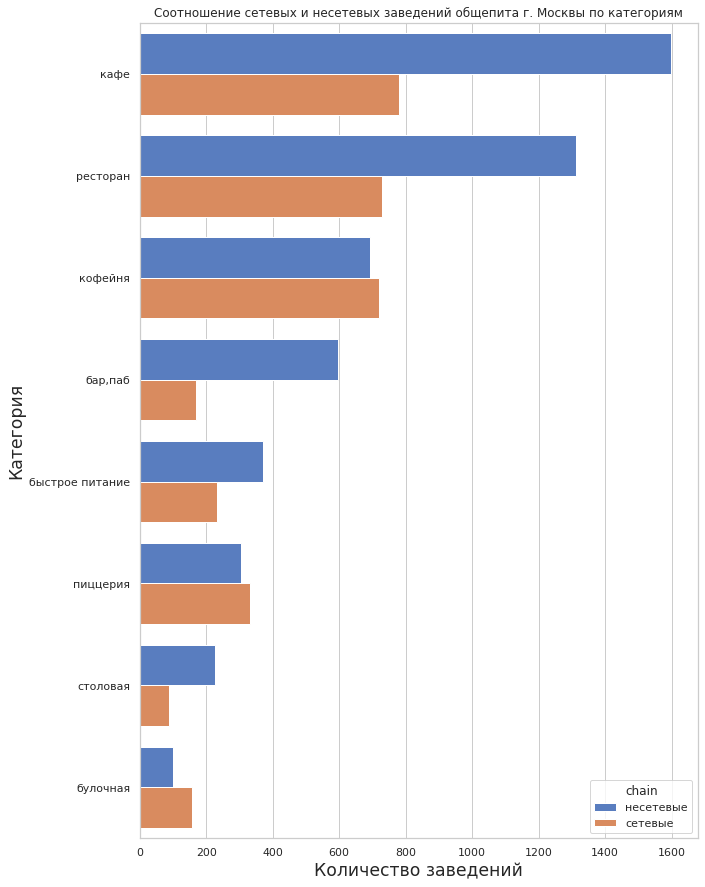

In [21]:
# Построим график. отражающий соотношение сетевых и несетевых заведений по категории
sns.set(rc={'figure.figsize':(10, 15)})
sns.set_theme(style="whitegrid")
sns.barplot(data=additional_pivot, x='count', y='category', hue='chain', palette='muted');
plt.ylabel('Категория', size='x-large')
plt.xlabel('Количество заведений', size='x-large')
plt.title('Соотношение сетевых и несетевых заведений общепита г. Москвы по категориям');

Чаще всего кофейни, пиццерии и булочные являются сетевыми заведениями (количество сетевых больше, чем несетевых).

### Анализ топ-15 популярных сетей в Москве. <a id="top_15"></a> 

In [22]:
# Отфильтруем данные по наличию сетевого признака и построим сфодную таблицу
top_15_pivot = df.query('chain == 1')
# используем столбец lat для подсчета строк со значениями
top_15_pivot = (top_15_pivot.pivot_table(index=['name', 'category'], values=['lat'], aggfunc='count')
                .sort_values(by='lat', ascending=False)
                .head(15))
top_15_pivot.columns = ['count']
top_15_pivot = top_15_pivot.reset_index()
top_15_pivot

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


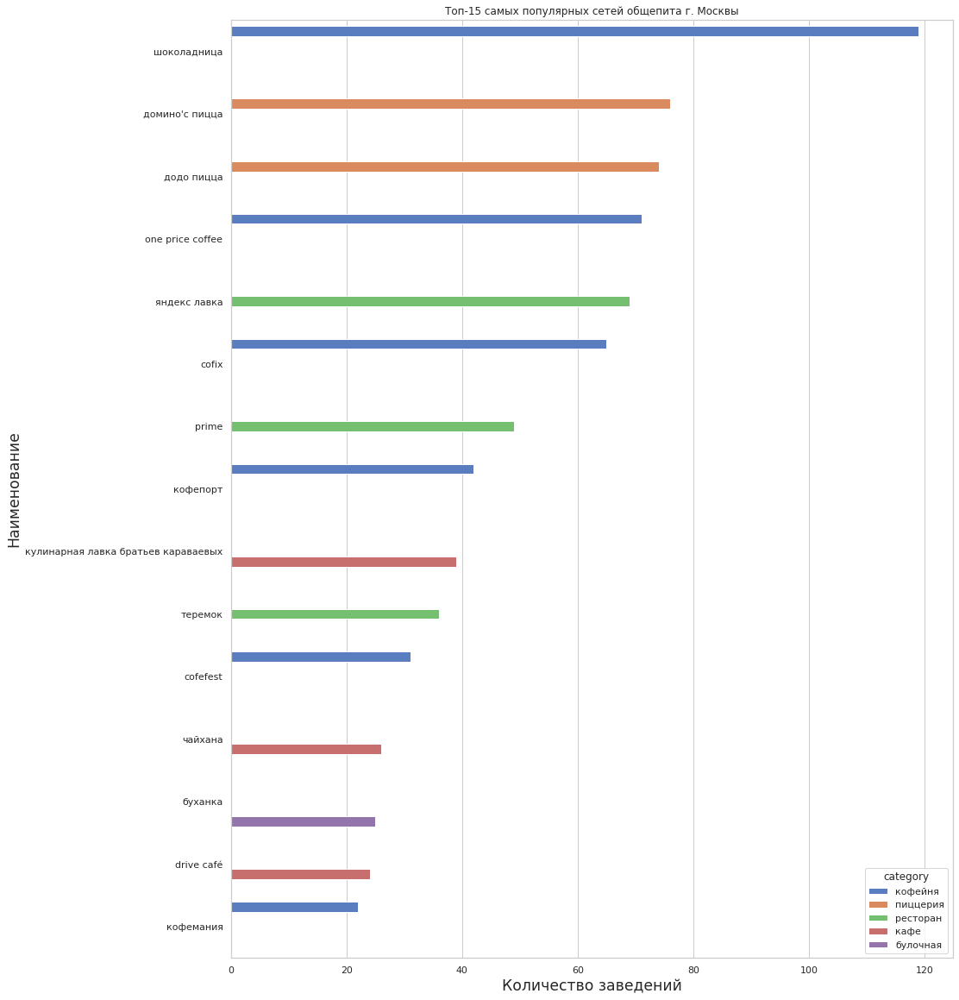

In [23]:
# Визуализируем данные столбчатой диаграммой с отражением категории заведения
sns.set(rc={'figure.figsize':(15, 20)})
sns.set_theme(style="whitegrid")
sns.barplot(data=top_15_pivot, x='count', y='name', hue='category', palette='muted');
plt.ylabel('Наименование', size='x-large')
plt.xlabel('Количество заведений', size='x-large')
plt.title('Топ-15 самых популярных сетей общепита г. Москвы');

Из топ-15 сетей общепита самой популярной является кофейня шоколадница, самой малочисленной - кофемания. В топ-15 входят 6 сетей кофеен, 2 пиццерии, 3 ресторана, 3 кафе и одна булочная. Самыми популярными сетями являются либо недорогие кофейни и пиццерии, либо точки общепита, которые активно работают на доставку и навынос.

### Анализ категорий заведений по округам г. Москвы. <a id="district"></a> 

In [24]:
# Посмотрим на представленные в датафрейме округа и количество заведений
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Наша таблица включает 9 районов г. Москвы.

In [25]:
# Создадим сводную таблицу и найдем общее количество заведений и количество заведений каждой категории по районам
district_pivot = df.pivot_table(index=['district', 'category'], values=['lat'], aggfunc='count').sort_values(by='lat', ascending=False)
district_pivot.columns = ['count']
district_pivot = district_pivot.reset_index()
district_pivot

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [26]:
# Визулизируем полученные данные
fig = (px.bar(district_pivot, x='district', y='count', title='Количество заведений с категориями по районам', color='category', 
              color_discrete_sequence=px.colors.qualitative.Antique, width=700, height=1200))
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis_title='Количество заведений')
fig.show() 

Наиболее популярная категория заведений в ЦАО - ресторан, во всех остальных районах кафе. Наибольшее число заведений находится в ЦАО, наименьшее в СЗАО.

### Анализ средних рейтингов по категориям заведений. <a id="rating_mean"></a> 

In [27]:
rating_pivot = (df.pivot_table(index=['category'], values=['rating'], aggfunc='mean')
                  .sort_values(by='rating', ascending=False).reset_index())
rating_pivot

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290402
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


In [28]:
# визуализируем полученные данные 
sns.set(rc={'figure.figsize':(15, 9)})
fig = (px.bar(rating_pivot, x='rating', y='category', text ='rating', 
              color='category', color_discrete_sequence=px.colors.qualitative.Antique))
fig.update_layout(showlegend=False,
                  title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Категория')
fig.show()

Средние рейтинги точек общепита почти не отличаются, из нашей визуализации и таблицы сложно сделать какой-либо вывод, но данная информация может быть полезна при дальнейшем исследовании для сравнения рейтингов заведений с каким-то отдельным округом/улицей и т.п.

### Построение фоновой картограммы (хороплет) со средним рейтингом заведений каждого района. <a id="choropleth"></a> 

In [29]:
# Создадим сводную таблицу с со средним рейтингом заведений каждого района
dr_pivot = (df.pivot_table(index=['district', 'category'], 
                           values=['rating'], aggfunc='mean').sort_values(by='rating', ascending=False))
dr_pivot = dr_pivot.reset_index()
dr_pivot

,district,category,rating
0,Центральный административный округ,"бар,паб",4.486264
1,Центральный административный округ,ресторан,4.416119
2,Центральный административный округ,пиццерия,4.411504
3,Западный административный округ,"бар,паб",4.398000
4,Северо-Западный административный округ,"бар,паб",4.391304
...,...,...,...
67,Северо-Восточный административный округ,быстрое питание,4.032927
68,Северный административный округ,быстрое питание,3.975862
69,Западный административный округ,быстрое питание,3.969355
70,Северо-Западный административный округ,быстрое питание,3.950000


In [30]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dr_pivot,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Хороплет уже гораздо информативнее предыдущего графика: мы можем уверенно сказать, что средний рейтинг заведений в ЦАО гораздо выше, чем в других районах. При этом в САО, СЗАО, ЗАО и ЮВАО рейтинг ниже 4.0.

### Отображение всех заведений датасета на карте с помощью кластеров. <a id="clusters"></a>

In [31]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Анализ топ-15 улиц по количеству заведений. <a id="top_15_count"></a>

In [32]:
# построим сводную таблицу
street_pivot = (df.pivot_table(index=['street'], values=['name'], aggfunc='count')
                  .sort_values(by='name', ascending=False).head(15))
street_pivot.columns = ['count']
street_pivot = street_pivot.reset_index()
street_pivot

,street,count
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Улица с самым большим количеством заведений - Проспект мира. Замыкает список Пятницкая улица.

In [33]:
# Теперь построим сводную таблицу, но по всем улицам и с категориями
street_pivot_df = df.pivot_table(index=['street','category'], values=['name'], aggfunc='count')
street_pivot_df.columns = ['count']
street_pivot_df = street_pivot_df.reset_index()
# Уберем все улицы кроме топ-15
street_pivot_df = street_pivot_df[street_pivot_df['street'].isin(street_pivot['street'])]
street_pivot_df

,street,category,count
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3174,улица миклухо-маклая,быстрое питание,4
3175,улица миклухо-маклая,кафе,21
3176,улица миклухо-маклая,кофейня,4
3177,улица миклухо-маклая,пиццерия,2


In [34]:
# Проверим, что в столбец street вошли только топ-15 улиц
street_pivot_df['street'].unique()

array(['варшавское шоссе', 'дмитровское шоссе', 'каширское шоссе',
       'кутузовский проспект', 'ленинградский проспект',
       'ленинградское шоссе', 'ленинский проспект', 'люблинская улица',
       'мкад', 'проспект вернадского', 'проспект мира',
       'профсоюзная улица', 'пятницкая улица', 'улица вавилова',
       'улица миклухо-маклая'], dtype=object)

Все корректно: 15 улиц.

In [35]:
# Визуализируем данные
fig = (px.bar(street_pivot_df, x='street', y='count', title='Количество заведений с категориями по топ-15 улиц', color='category', 
              color_discrete_sequence=px.colors.qualitative.Antique, width=700, height=1200))
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Улица', xaxis={'categoryorder':'total descending'}, yaxis_title='Количество заведений')
fig.show() 

Топ-15 улиц представляют собой самые большие улицы г. Москвы (МКАД, шоссе, проспекты). Вдоль этих улиц также располагаются большое количество торговых центров, что, учитывая их протяженность, обуславливает такое большое количество заведений на одной улице.

### Анализ улиц с одним объектом общепита. <a id="single_object"></a>

In [36]:
# построим сводную таблицу 
one_pivot = (df.pivot_table(index=['street'], values=['name'], aggfunc='count')
               .sort_values(by='name', ascending=False))
one_pivot.columns = ['count']
one_pivot = one_pivot[one_pivot['count'] == 1]
one_pivot = one_pivot.reset_index()
one_pivot

,street,count
0,улица капотня,1
1,улица острякова,1
2,улица фотиевой,1
3,якиманский переулок,1
4,улица мжд киевское 5-й км,1
...,...,...
452,островная улица,1
453,отрадный проезд,1
454,павелецкая набережная,1
455,1-й балтийский переулок,1


In [37]:
# Создадим переменную с одним заведением
one_df = df[df['street'].isin(one_pivot['street'])].reset_index()
one_df

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
1,21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
2,25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
3,58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
4,60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8289,мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица шкулёва,False
453,8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица артюхиной,False
454,8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,кузьминская улица,False
455,8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,новороссийская улица,False


In [38]:
# Посмотрим на округа, в которых располагаются заведения из таблицы
one_df['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

In [39]:
# Выведем описательную статистику по рейтингу заведений на этих улицах
one_df['rating'].describe().round(2)

count    457.00
mean       4.24
std        0.46
min        1.00
25%        4.10
50%        4.30
75%        4.50
max        5.00
Name: rating, dtype: float64

Средний рейтинг и расположение мало чем отличаются от средних по всему датафрейму.

In [40]:
# Посмотрим много ли сетевых заведений на данных улицах 
one_df['chain'].value_counts()

0    324
1    133
Name: chain, dtype: int64

In [41]:
one_df[one_df['is_24_7'] == True].count()

index                31
name                 31
category             31
address              31
district             31
hours                31
lat                  31
lng                  31
rating               31
price                 9
avg_bill             10
middle_avg_bill      10
middle_coffee_cup     0
chain                31
seats                10
street               31
is_24_7              31
dtype: int64

Соотношение сетевых и несетевых заведений также в пользу последних, как и в среднем по исходному датафрейму. 31 заведений являются круглосуточными.

Исходя из полученной информации сложно сделать какие-либо однозначные выводы об отличии данных улиц от других в нашем исходном датафрейме.

### Анализ средних чеков заведений. <a id="mean_bill"></a>

In [42]:
# Построим сводную таблицу
avgbill_pivot = df.pivot_table(index=['district'], values=['middle_avg_bill'], aggfunc='median')
avgbill_pivot = avgbill_pivot.reset_index()
avgbill_pivot

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [43]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avgbill_pivot,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

### Промежуточный вывод. <a id="prelim"></a>

- В таблице представлено 8 категорий заведений кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная. Самая многочисленная категория - кафе.
- Наибольшее количество посадочных мест приходится на категорию бар/паб, рестораны и кофейни, наименьшее - на булочные.
- В таблице 61.9% заведений - несетевые, а 38.1% - сетевые.
- Самые популярные категории сетевых заведений - кафе (24,3%), рестораны (22.8%) и кофейни (22.5%). Самая непопулярная категория - столовая.
- Установлено, что самые популярные сетевые заведения - "Шоколадница", "Домино'с пицца" и "Додо пицца".
- В ЦАО г. Москвы самой популярной категорией являются рестораны, в остальных округах - кафе.
- Самый высокий средний рейтинг заведений также приходится на ЦАО.
- Улицы с самым большим количеством точек общепита - МКАД, шоссе и проспекты, что обусловлено их протяженностью и расположением ТЦ.
- На улицах с единственной точкой общепита не было найдено каких-то закономерностей и отличий от общих данных датафрейма.
- ЦАО и ЗАО - лидеры по размеру среднего чека.

## Детализирование исследования: открытие кофейни. <a id="detailed"></a>

In [44]:
# Подсчет количества кофеен представленных в датафрейме
df['category'].value_counts()

кафе               2378
ресторан           2042
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Всего в таблице представлено 1413 кофеен. Далее посмотрим их распределние по районам г. Москвы.

In [45]:
# Создадим переменную, где хранятся только значения кофеен
coffeshop_var = df.query('category== "кофейня"')
# Построим сводную таблицу, чтобы посмотреть их расположение по районам
coffeshop_pivot = (coffeshop_var.pivot_table(index=['district'], values=['name'], aggfunc='count').sort_values(by='name', ascending=False))
coffeshop_pivot.columns = ['count']
coffeshop_pivot = coffeshop_pivot.reset_index()
coffeshop_pivot

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Больше всего кофеен находится в ЦАО, САО и СВАО, меньше всего в СЗАО.

In [46]:
# Визуализируем данные 
fig = px.bar(coffeshop_pivot, x='district', y='count', title='Количество кофеен по округам г. Москвы', color='district', color_discrete_sequence=px.colors.qualitative.Antique, width=1000, height=800)
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Округ', yaxis_title='Количество кофеен')
fig.show() 

Посмотрим, есть ли в нашем датафрейме круглосуточные кофейни.

In [47]:
# Выведем значения True из столбца is_24_7
coffeshop_pivot_24 = coffeshop_var.query('is_24_7==True')
coffeshop_pivot_24

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,ленинградский проспект,True
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,ленинградский проспект,True
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица золоторожский вал,True
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,лесная улица,True
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,долгоруковская улица,True


In [48]:
print('Количество круглосуточных кофеен - ', coffeshop_pivot_24['name'].count(), 'шт')

Количество круглосуточных кофеен -  59 шт


In [49]:
# Посмотрим на их расположение по округам
coffeshop_pivot_24['district'].value_counts()

Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Северный административный округ             5
Восточный административный округ            5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
Name: district, dtype: int64

In [50]:
# Посмотрим на их расположение на карте г.Москвы

# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffeshop_pivot_24.apply(create_clusters, axis=1)

# выводим карту
m

Большинство круглосуточных кофеен расположены в ЦАО, а в ЮАО и ЮВАО есть только одно круглосуточное заведение на весь округ! Далее посмотрим на рейтинги кофеен и их распределние по округам г. Москвы.

In [51]:
# Выведем описательную статистику по столбцу rating 
coffeshop_var['rating'].describe().round(2)

count    1413.00
mean        4.28
std         0.37
min         1.40
25%         4.10
50%         4.30
75%         4.40
max         5.00
Name: rating, dtype: float64

Средний рейтинг заведений - 4.28, медианный - 4.3. В таблице есть кафе с самым низким рейтингом в 1.4 и самым высоким - 5.00. Теперь визуализируем данные и посмотрим рейтиенги в разрезе округов г. Москвы.

In [52]:
coffeshop_pivot_map = (coffeshop_var.pivot_table(index=['district'], values=['rating'], aggfunc='mean')
                                    .sort_values(by='rating', ascending=False)
                                    .reset_index())
coffeshop_pivot_map

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


In [53]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffeshop_pivot_map,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Наиболее высокий рейтинг у кофеен ЦАО и СЗАО, наиболее низкий у кофеен ЗАО и СВАО. Далее проанализируем цену средней чашки капучино.

In [54]:
# Выведем описательную статистику столбца middle_coffee_cup
coffeshop_var['middle_coffee_cup'].describe().round()

count     521.0
mean      175.0
std        90.0
min        60.0
25%       124.0
50%       170.0
75%       225.0
max      1568.0
Name: middle_coffee_cup, dtype: float64

Средняя цена чашки кофе - 175 рублей, а медианная - 170 рублей. Посмотрим на распределение с учетом округов г. Москвы.

In [55]:
# Средняя цена чашки кофе по округам г.Москвы
table_1 = (coffeshop_var.pivot_table(index=['district'], values=['middle_coffee_cup'], aggfunc='mean')
             .sort_values(by='middle_coffee_cup', ascending=False)
             .reset_index())
table_1['middle_coffee_cup'] = table_1['middle_coffee_cup'].round()
table_1

,district,middle_coffee_cup
0,Западный административный округ,190.0
1,Центральный административный округ,188.0
2,Юго-Западный административный округ,184.0
3,Восточный административный округ,174.0
4,Северный административный округ,166.0
5,Северо-Западный административный округ,166.0
6,Северо-Восточный административный округ,165.0
7,Южный административный округ,158.0
8,Юго-Восточный административный округ,151.0


Стоимость средней чашки кофе варируется от 151 рубля до 190 рублей.

In [56]:
# визуализируем полученные данные 
sns.set(rc={'figure.figsize':(15, 9)})
fig = (px.bar(table_1, x='middle_coffee_cup', y='district', text ='middle_coffee_cup', 
              color='district', color_discrete_sequence=px.colors.qualitative.Antique))
fig.update_layout(showlegend=False,
                  title='Средняя цена одной чашки капучино по округам г. Москвы',
                  xaxis_title='Стоимость чашки капучино (в руб.)',
                  yaxis_title='Округ')
fig.show()

In [57]:
# Медианная цена чашки кофе по округам г.Москвы
table_2 = (coffeshop_var.pivot_table(index=['district'], values=['middle_coffee_cup'], aggfunc='median')
             .sort_values(by='middle_coffee_cup', ascending=False)
             .reset_index())
table_2['middle_coffee_cup'] = table_2['middle_coffee_cup'].round()
table_2

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.0
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,148.0
8,Восточный административный округ,135.0


In [58]:
# визуализируем полученные данные 
sns.set(rc={'figure.figsize':(15, 9)})
fig = (px.bar(table_2, x='middle_coffee_cup', y='district', text ='middle_coffee_cup', 
              color='district', color_discrete_sequence=px.colors.qualitative.Antique))
fig.update_layout(showlegend=False,
                  title='Медианная цена одной чашки капучино по округам г. Москвы',
                  xaxis_title='Стоимость чашки капучино (в руб.)',
                  yaxis_title='Округ')
fig.show()

Медианная стоимость одной чашки капучино варируется от 135 до 198 рублей.

## Вывод. <a id="conclusion"></a>

- Самый большой округ г. Москвы по количеству кофеен - ЦАО. С одной стороны, там большая конкуренция, но с другой большое количество кофеен говорит о наличие большого объема платежеспособного спроса.
- В Москве очень мало круглосуточных кофеен - 59 шт. Это говорит о нецелесообразности открытия круглосуточной кофейни, ниша очень маленькая, а кофе это не очень популярный напиток в контексте жизни ночного города.
- Самые низкие рейтинги у кофеен САО, ЗАО и ЮАО, но и объем спроса там несоразмерен с ЦАО. В ЦАО средний рейтинг не такой высокий как в СВАО и ВАО, но это может объяснятся куда большим количеством кофеен в самом ЦАО.
- При расчете средней цены чашки кофе стоит ориентироваться на показатели ЦАО в примерно 190 рублей.